In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches
import mplstereonet
import skimage.exposure
import harmonica as hm
import verde as vd

import micromag as mg

import time

# Read QDM data

First, we create a read the observation points.

In [2]:
nc_file = "NRM10.mat"
data_dir = pathlib.Path("")/"real-data"
data = mg.load_qdm(data_dir / nc_file)

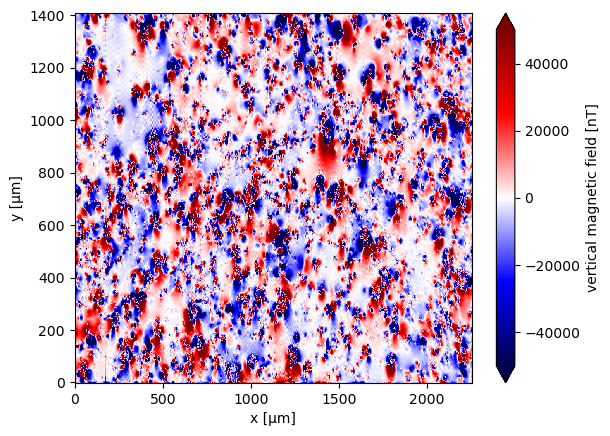

In [3]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

In [4]:
# copy data sets
data_copy = data.copy(deep=True)
data_copy2 = data_copy.copy(deep=True)

x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

# Anomaly detection

First part of our method is an automatic way to detect and separate the signal of each dipole in the data. This is done in the following steps:

1. Upward continue the data to suppress high frequency noise
2. Calculate the total gradient amplitude (TGA) to concentrate the anomalies on top of the sources
3. Contrast stretch the TGA to highlight weaker sources
4. Run the Laplacian of Gaussian (LoG) method for blog detection to find the anomalies

## 1. Upward continue the data to suppress the high-frequency noise

In this step, we want to upward continue as little as possible to make sure we retain most of the signal.

In [5]:
height_difference = 5

# Have to assign the same points as the data because the Harmonica
# transforms give slightly different coordinates due to round-off.
# This is a bug and is being worked on.
data_up = (
    hm.upward_continuation(data.bz, height_difference)
    .assign_attrs(data.bz.attrs)
    .to_dataset(name="bz")
    .assign_coords(x=data.x, y=data.y)
    .assign_coords(z=data.z + height_difference)
)
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 9MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -305.5 51.27 -82.41 ... -2.019e+03 -1.471e+03

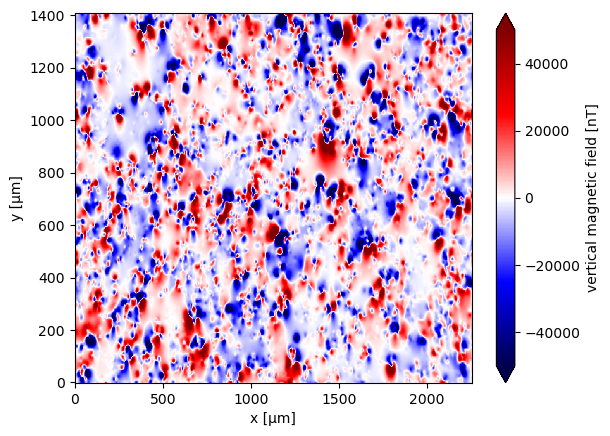

In [6]:
data_up.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

## 2. Calculate the TGA

We do this with finite difference derivatives to avoid amplifying noise.

In [7]:
data_up = data_up.assign(mg.data_gradients(data_up.bz))
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -305.5 51.27 -82.41 ... -2.019e+03 -1.471e+03
    tga      (y, x) float64 5MB 802.2 882.6 734.8 753.1 ... 205.5 223.0 360.2
    x_deriv  (y, x) float64 5MB 151.8 47.46 -64.49 -70.1 ... 137.6 199.4 232.9
    y_deriv  (y, x) float64 5MB 184.5 214.5 194.0 135.0 ... -152.6 -84.1 92.36
    z_deriv  (y, x) float64 5MB -765.8 -854.8 -705.8 ... 0.002256 -54.09 -258.8

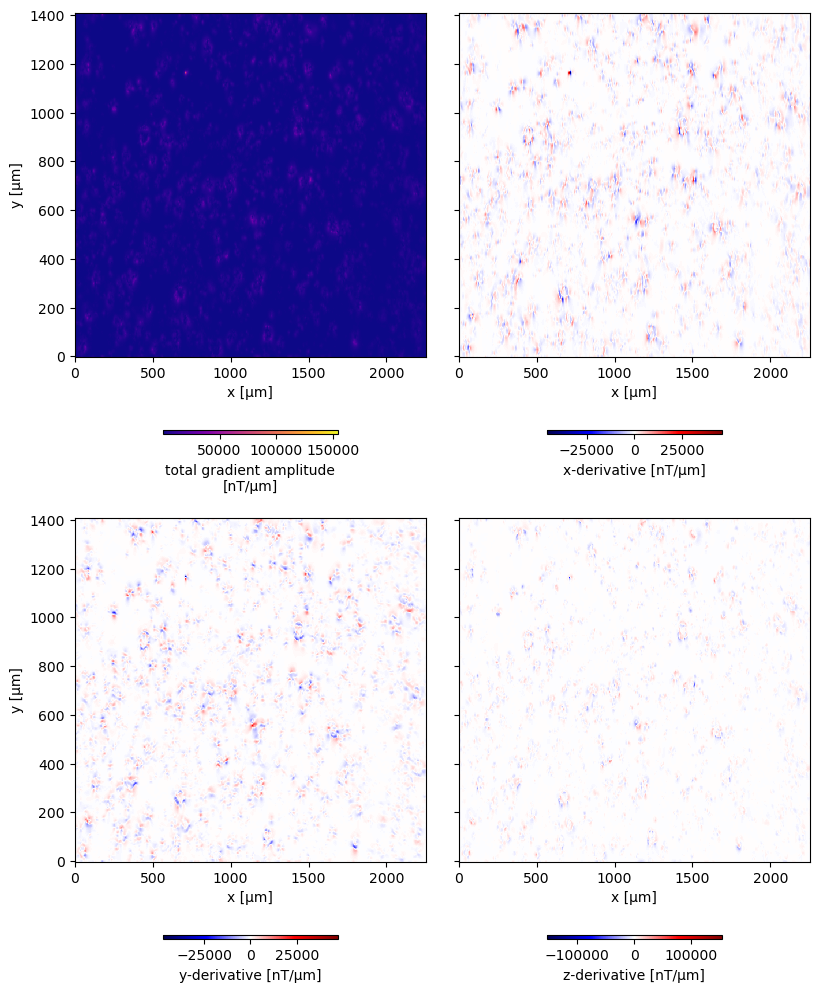

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(8, 10), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "x_deriv", "y_deriv", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
    else:
        cmap="seismic"
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs)
for ax in axes.ravel():
    ax.set_aspect("auto")
    
axes[0,1].set_ylabel(None)
axes[1,1].set_ylabel(None)
plt.tight_layout(pad=0, h_pad=0, w_pad=2)

## 3. Stretch the contrast

Now we need to stretch the contrast of the TGA to make the anomalies easier to detect.

In [9]:
stretched = skimage.exposure.rescale_intensity(
    data_up.tga, 
    in_range=tuple(np.percentile(data_up.tga, (1, 99))),
)
data_up = data_up.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

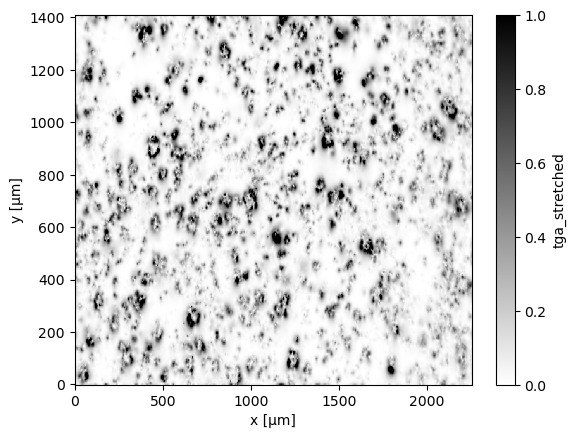

In [10]:
data_up.tga_stretched.plot.pcolormesh(cmap="gray_r")

## 4. Blob detection

To detect the bounding boxes of each anomaly, we use the LoG method in scikit-image. The code below calls it with some conveniences, like passing the range of anomaly sizes in physical units (µm) instead of number of pixels. It returns the bounding box of each anomaly (x_min, x_max, y_min, y_max) also in physical units.

In [11]:
start_detection_time = time.perf_counter()

windows = mg.detect_anomalies(
    data_up.tga_stretched, 
    size_range=[20, 100],
    size_increment=1.0,
    threshold=0.05,
    overlap=1.0,
    exclude_border=30,
    nsizes=20,
)

end_detection_time = time.perf_counter()

In [12]:
detection_time = end_detection_time-start_detection_time

print(f'{np.shape(windows)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

863 potential sources detected within 1.7591 seconds


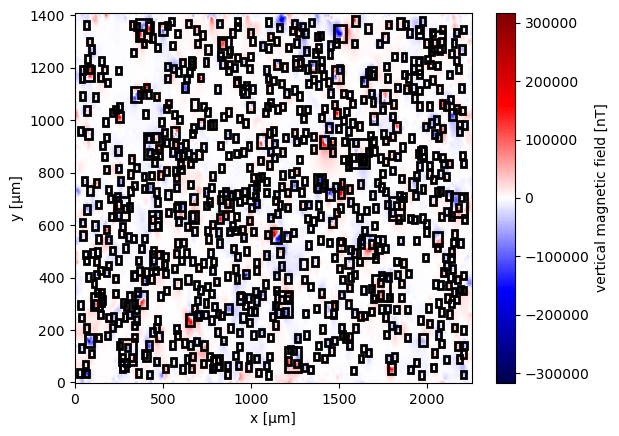

In [13]:
ax = plt.subplot(111)
data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

Now that we know the bounding box of each anomaly, we can run the Euler deconvolution and moment inversion for each anomaly separately.

# Euler Deconvolution and Inversion (Standard method)

Run the Euler Deconvolution and the inversion on each window.

In [14]:
start_inversion_time = time.perf_counter()

positions = []
estimated_dipole_moments = []
estimated_stds = []
calculated_r2 = []
calculated_SNR = []
windows_filtered = []
base_levels = []
for window in windows:
    anomaly = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
#     anomaly = data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    data_minus_background = anomaly.bz.values - base_level
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    moment, covariance, r2, SNR = mg.dipole_moment_inversion(
        anomaly.data_minus_background, position,
    )
    
    # Filter out solutions that don't meet quality criteria
    bad_euler = False # position[2] > 0
    poor_fit = False
    
#    bad_euler = position[2] > 0
#     poor_fit = r2 < 0.85
    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s"%(r2,SNR))  
    positions.append(position)  
    estimated_dipole_moments.append(moment)
    estimated_stds.append(mg.covariance_to_angle_std(moment, covariance))
    calculated_r2.append(r2)
    calculated_SNR.append(SNR)
    windows_filtered.append(window)
    base_levels.append(base_level)
positions = np.transpose(positions)


end_inversion_time = time.perf_counter()

In [15]:
inversion_time = end_inversion_time-start_inversion_time
print(f"{positions.shape[1]} euler positions and dipole moments estimated within {round(inversion_time, 4)} seconds", )

863 euler positions and dipole moments estimated within 3.6389 seconds


# Iterative Euler deconvolution

In [16]:
import scipy as sp
import numba
import choclo
# @numba.jit(nopython=True, parallel=True)
def goal_function(parameter, obs_data, coordinates, amplitude, x_0, y_0, z_0):
    bz = mg.dipole_bz(coordinates, 
                      ([parameter[0]*x_0], [parameter[1]*y_0], [parameter[2]*z_0]),
                     np.array([parameter[3], parameter[4], parameter[5]])*amplitude
                     )
                   
    
    Res = np.linalg.norm(obs_data-bz.ravel())
    # print(Res)
    return(Res)

In [17]:
x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

In [18]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()


x_concat = []
y_concat = []
z_concat = []
bz_concat = []
xc_concat = []
yc_concat = []
zc_concat = []
z_deriv_concat = []

estimated_dipole_moments_itr_euler = []

# fitting parameters
calculated_r2_itr_euler = []
calculated_SNR_itr_euler = []

data_copy = data.copy(deep=True)
data_up_copy = data_up.copy(deep=True)

base_levels_itr_euler = []
#################################
for window in rich.progress.track(np.array(windows), total = len(np.array(windows))):
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )

    base_levels_itr_euler.append(base_level)
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2


    estimated_dipole_moments_itr_euler.append(moment)
    
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard
    
#     print(discard.max())
    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s | %s"%(r2,SNR,position[2]))  
    xx, yy = np.meshgrid(anomaly.x.values, anomaly.y.values)
    x_concat = np.append(x_concat, xx)
    y_concat = np.append(y_concat, yy)    
    z_concat = np.append(z_concat, anomaly.z.values)
    bz_concat = np.append(bz_concat, anomaly.bz.values)
    z_deriv_concat = np.append(z_deriv_concat, anomaly.z_deriv.values)
    xc_concat = np.append(xc_concat, position[0])
    yc_concat = np.append(yc_concat, position[1])
    zc_concat = np.append(zc_concat, position[2])
    calculated_r2_itr_euler = np.append(calculated_r2_itr_euler, r2)
    calculated_SNR_itr_euler = np.append(calculated_SNR_itr_euler, SNR)


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

In [19]:
itr_euler_time = end_itr_euler_time-start_itr_euler_time
print(f"Time for the iterative Euler solution and dipole moment estimation: {round(itr_euler_time, 4)} seconds", )

Time for the iterative Euler solution and dipole moment estimation: 216.3503 seconds


In [20]:
df = pd.DataFrame({'x':x_concat,
                   'y':y_concat,
                   'z':z_concat,
                  'bz':bz_concat,
                 'z_deriv':z_deriv_concat})

df.head()

,x,y,z,bz,z_deriv
0,700.30,1149.15,10.0,13187.823098,1299.452259
1,702.65,1149.15,10.0,20484.501361,818.201682
2,705.00,1149.15,10.0,29827.555559,-332.685010
3,707.35,1149.15,10.0,39726.638952,-2027.063074
4,709.70,1149.15,10.0,47063.594685,-3982.784973


In [21]:
positions_itr = np.array([xc_concat, yc_concat, zc_concat])

In [22]:
# indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# indexes
# euler_r2_itr_cond

Output()

Output()

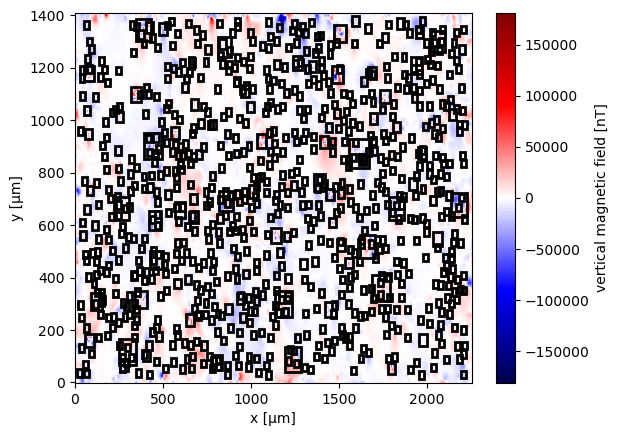

In [23]:
## EULER ENHANCEMENT SECOND STEP
warnings.filterwarnings("ignore")
data_copy = data.copy(deep=True)
euler_r2_itr_cond = calculated_r2_itr_euler>=0.999

zc_concat_temp = list()
xc_concat_temp = list()
yc_concat_temp = list()

estimated_dipole_moments_itr_euler_temp = list()

indexes = np.where(np.array(euler_r2_itr_cond))[0]
# SOURCES WITH R2 >= 0.99 ARE NOT ENHANCED, WE CALCULATE THEIR ANOMALY AND REMOVE THEM FROM THE DATA SET
# for index, window in enumerate(rich.progress.track(np.array(windows)[euler_r2_itr_cond], total=len(np.array(windows)[euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    position = positions_itr[:, index]
    estimated_dipole_moments_itr_euler_temp.append(estimated_dipole_moments_itr_euler[index])
    xc_concat_temp = np.append(xc_concat_temp, position[0])
    yc_concat_temp = np.append(yc_concat_temp, position[1])
    zc_concat_temp = np.append(zc_concat_temp, position[2])  

    
# remove all signals 
position_temp = np.array([xc_concat_temp, yc_concat_temp, zc_concat_temp])
discard = mg.dipole_bz(coordinates, position_temp, estimated_dipole_moments_itr_euler_temp)
data_copy.bz.values -= discard

data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))

# SOURCES WITH R2 <= 0.99 ARE ENHANCED
indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# for index, window in enumerate(rich.progress.track(np.array(windows)[~euler_r2_itr_cond], total=len(np.array(windows)[~euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}
    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)



    ## SCIPY MINIMIZATION
    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
        
        if r2 >= calculated_r2_itr_euler[index]:
            estimated_dipole_moments_itr_euler[index] = moment
            positions_itr[:, index] = position
    
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))



ax = plt.subplot(111)
data_up_copy.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   


# Comparison plots

## Euler comparison

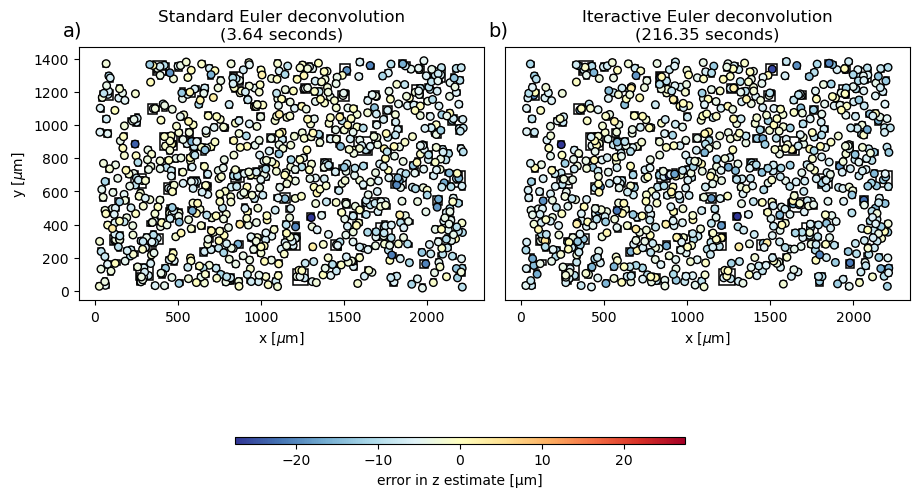

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(9, 9))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.015, shrink=0.5)

# data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
axes = axes.ravel()

scale = vd.maxabs((positions[2]))

ax = axes[0]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions[:2], c=positions[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

ax = axes[1]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

titles = ([r'Standard Euler deconvolution'   +'\n'+ f'({round(inversion_time, 2)} seconds)', 
           r'Iteractive Euler deconvolution' +'\n'+ f'({round(itr_euler_time, 2)} seconds)'])
for ax, letter, title in zip(axes, "a b".split(), titles):
    ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(r"x [$\mu$m]")

axes[1].set_yticks([])
axes[0].set_ylabel(r"y [$\mu$m]")
plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


fig.colorbar(tmp, **cbar_kwargs, label="error in z estimate [µm]", cax=fig.add_axes([0.25, 0.2, 0.5, 0.0075]))


plt.show()

In [25]:
fig_dir = pathlib.Path("..") / "paper" / "figures"
mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

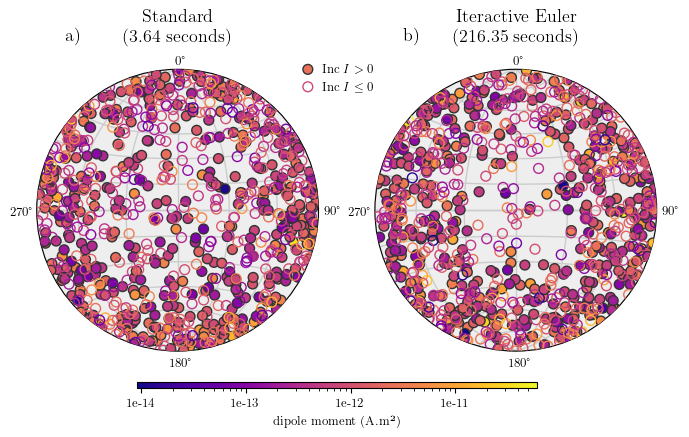

In [26]:
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(8, 4))
    axes = []

#     estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
#     vmin = np.min(estimated)
#     vmax = np.max(estimated)
    
    estimated1 = mg.vector_to_angles(estimated_dipole_moments)[2]
    estimated2 = mg.vector_to_angles(estimated_dipole_moments_itr_euler)[2]

    
    vmin = np.min([np.min(estimated1),np.min(estimated2)])
    vmax = np.max([np.max(estimated1),np.max(estimated2)])
    
    cmap = "plasma"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize

        
    ## STANDARD METHOD
    ax = fig.add_subplot(1, 2, 1, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs)
    ax.legend(loc=(0.9, 0.9), frameon=False, handletextpad=0.1, prop = {'size' : 9})
    fig.colorbar(
        tmp, 
        cax=fig.add_axes([0.25, 0.05, 0.5, 0.015]), 
        format="%.0g",
        label="dipole moment (A.m²)",
        orientation="horizontal",
    )

    
    ## ITERACTIVE METHOD
    ax = fig.add_subplot(1, 2, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs)

    
    ######
    titles = ([r'Standard'+'\n'+ f'({round(inversion_time, 2)} seconds)', 
           'Iteractive Euler'+'\n'+ f'({round(itr_euler_time, 2)} seconds)']) 
 

    for ax, letter, title in zip(axes, "a b".split(), titles):
        ax.text(0.1, 1.1, f"{letter})   ", transform=ax.transAxes, fontsize=13)
        ax.set_title(title+'\n', fontsize=13, loc='center')
    fig.subplots_adjust(wspace=0.2, hspace=0.5)

    plt.show()


# Paper's figures 

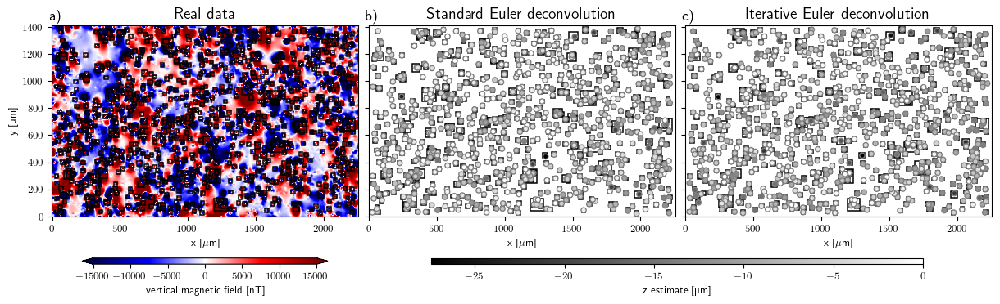

In [27]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data_up['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir/"euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


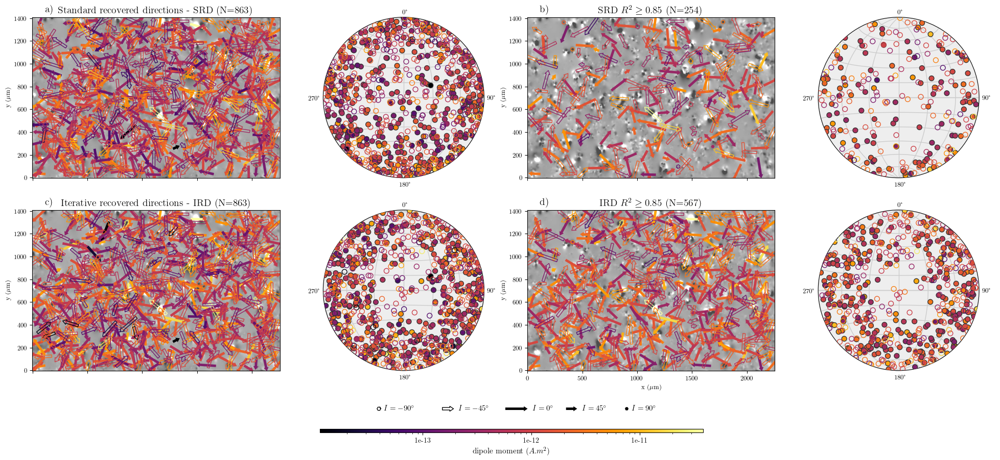

In [28]:
import warnings
warnings.filterwarnings('ignore')

r_square_filter = 0.85

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments_itr_euler, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)   

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r_square_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r_square_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir/"real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    # fig.savefig("real-data-stereograms.pdf", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

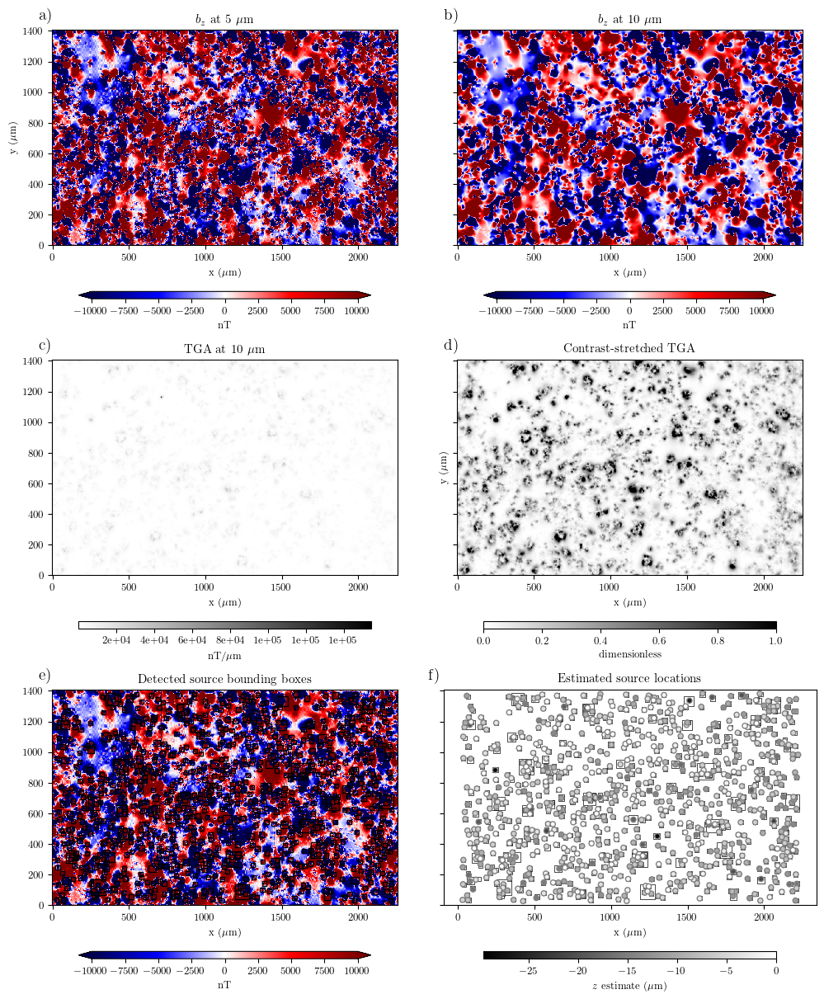

In [29]:
sensor_sample_distance = float(data.z.values.mean())
vmax=+10000
vmin=-10000
with plt.rc_context(mpl_rc):

    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey="row")
    axes = axes.ravel()    
    cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.5)
    
    ax = axes[0]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    

    ax = axes[1]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    
    ax = axes[2]   
    ax.set_aspect("equal")
    ax.set_title(f"TGA at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.tga.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="nT/$\mu$m", **cbar_kwargs, format="%.0e")
    
    ax = axes[3]  
    ax.set_aspect("equal")
    ax.set_title(f"Contrast-stretched TGA")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data_up.tga_stretched.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="dimensionless", **cbar_kwargs)
    
    ax = axes[4]  
    ax.set_aspect("equal")
    ax.set_title(f"Detected source bounding boxes")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')    
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)   
    
        
    ax = axes[5]  
    ax.set_aspect("equal")
    ax.set_title(f"Estimated source locations")
    ax.set_xlabel("x ($\mu$m)")
    scale = 100
#     tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r",  add_colorbar=False, add_labels=False)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=0.5,
        )
        ax.add_patch(rect)
    scale = vd.maxabs(positions_itr[2])
    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')
    fig.colorbar(tmp, ax=ax, label="$z$ estimate ($\mu$m)", **cbar_kwargs)    
    
    for ax, letter in zip(axes, "a b c d e f".split()):
        ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)

    plt.tight_layout(pad=0, h_pad=0, w_pad=-10)
    
    # fig.savefig("processing_steps.png", dpi=300, facecolor='w', bbox_inches='tight')
    
    plt.show()

In [30]:
data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


In [31]:
data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
data_up_copy

<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -248.6 118.0 -2.427 ... -2.054e+03 -1.475e+03
    tga      (y, x) float64 5MB 744.5 815.7 665.5 676.9 ... 201.0 220.7 344.5
    x_deriv  (y, x) float64 5MB 156.0 52.38 -59.19 -66.71 ... 151.0 212.6 246.3
    y_deriv  (y, x) float64 5MB 211.4 240.2 222.7 169.2 ... -124.1 -58.83 111.4
    z_deriv  (y, x) float64 5MB -696.6 -777.8 -624.3 ... 46.96 -6.836 -213.5

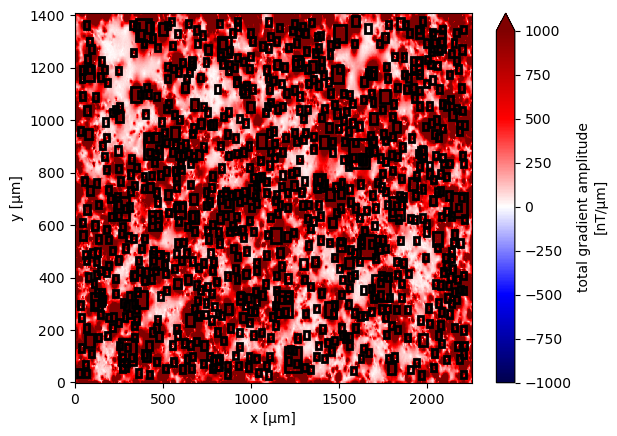

In [32]:
ax = plt.subplot(111)
scale=1000
data_up_copy.tga.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-scale, vmax=scale)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

In [33]:
stretched = skimage.exposure.rescale_intensity(
    data_up_copy.tga, 
    in_range=tuple(np.percentile(data_up_copy.tga, (1, 99))),
)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

In [34]:
start_detection_time = time.perf_counter()

windows_new = mg.detect_anomalies(
    data_up_copy.tga_stretched, 
    size_range=[20,150],
    size_increment=1.3,
    threshold=0.025,
    overlap=0.0,
    exclude_border=15
)
# windows
end_detection_time = time.perf_counter()

In [35]:
detection_time = end_detection_time-start_detection_time
print(f'{np.shape(windows_new)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

802 potential sources detected within 1.328 seconds


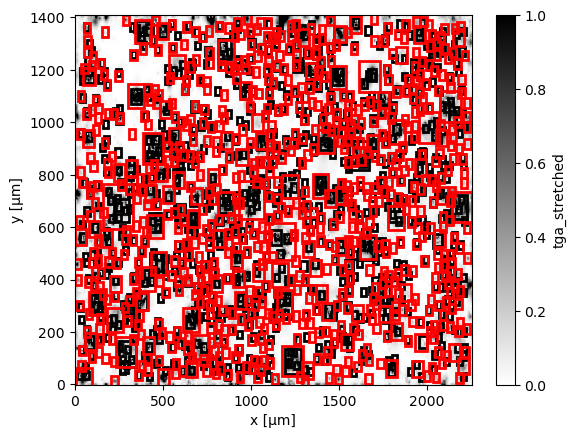

In [36]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

for window in windows_new:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [37]:
def intersects(window1, window2):
    # Verifica se há sobreposição horizontal
    horizontal_overlap = (window1[0] <= window2[1]) and (window2[0] <= window1[1])
    # Verifica se há sobreposição vertical
    vertical_overlap = (window1[2] <= window2[3]) and (window2[2] <= window1[3])
    return horizontal_overlap and vertical_overlap
    


# Remove overlapping windows
non_overlapping_windows = np.copy(windows_new)

for window in windows:
    non_overlapping_windows = [nw for nw in non_overlapping_windows if not intersects(nw, window)]

print("Non-overlapping windows:")
for window in non_overlapping_windows:
    print(window)

Non-overlapping windows:
[1433.91522369 1470.68477631 1370.46522369 1407.23477631]
[919.26522369 956.03477631   9.81522369  46.58477631]
[1.47856522e+03 1.51533478e+03 4.15223689e-01 3.71847763e+01]
[ 961.56522369  998.33477631 1375.16522369 1411.93477631]
[ -4.28477631  32.48477631 439.86522369 476.63477631]
[ 270.66522369  307.43477631 1372.81522369 1409.58477631]
[207.21522369 243.98477631  -4.28477631  32.48477631]
[1119.01522369 1155.78477631    2.76522369   39.53477631]
[1290.56522369 1327.33477631   -4.28477631   32.48477631]
[ -1.93477631  34.83477631 381.11522369 417.88477631]
[623.16522369 659.93477631 167.26522369 204.03477631]
[2214.11522369 2250.88477631  463.36522369  500.13477631]
[1053.21522369 1089.98477631  505.66522369  542.43477631]
[1922.71522369 1959.48477631 1363.41522369 1400.18477631]
[1238.86522369 1275.63477631  674.86522369  711.63477631]
[1565.51522369 1602.28477631  526.81522369  563.58477631]
[754.76522369 791.53477631 141.41522369 178.18477631]
[552.6652

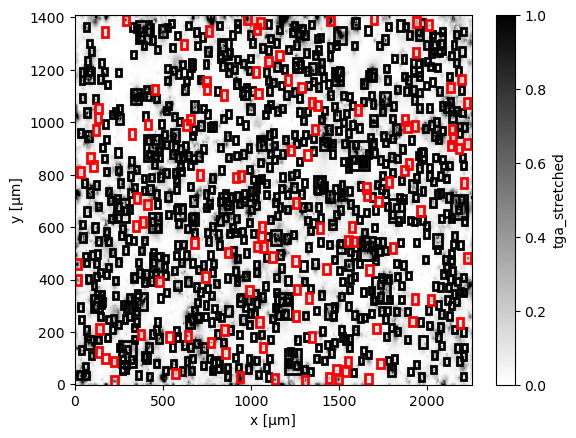

In [38]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [39]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()

data_copy_2 = data_copy.copy(deep=True)
data_up_copy_2 = data_up_copy.copy(deep=True)

positions_itr_enhanced = list(np.copy(positions_itr))
estimated_dipole_moments_itr_euler_enhanced = list(np.copy(estimated_dipole_moments_itr_euler))
windows_enhanced = list(np.copy(windows))
calculated_r2_itr_euler_enhanced = list(np.copy(calculated_r2_itr_euler))
base_levels_itr_euler_enhanced = list(np.copy(base_levels_itr_euler))

#################################
for window in rich.progress.track(np.array(non_overlapping_windows), total = len(np.array(non_overlapping_windows))):
    anomaly = data_up_copy_2.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    base_levels_itr_euler_enhanced.append(base_level)
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
    else:
        print('piorou')


    windows_enhanced.append(window)
    estimated_dipole_moments_itr_euler_enhanced.append(moment)
    for i in range(3):
        positions_itr_enhanced[i]=np.append(positions_itr_enhanced[i], position[i])
    calculated_r2_itr_euler_enhanced.append(r2)
    # estimated_dipole_moments_itr_euler.append(moment)
    print(position)
    print(moment)
    print(mg.vector_to_angles(moment))
    print(r2)
    print()
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy_2.bz.values -= discard
    
#     print(discard.max())
    data_up_copy_2 = (
                hm.upward_continuation(data_copy_2.bz, height_difference)
                .assign_attrs(data_copy_2.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy_2.x, y=data_copy_2.y)
                .assign_coords(z=data_copy_2.z + height_difference)
                   )
    
    
    data_up_copy_2 = data_up_copy_2.assign(mg.data_gradients(data_up_copy_2.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

[1452.91077531 1392.25053285   -4.76097751]

[ 1.15824090e-12 -5.45912819e-14  6.85425011e-13]

(-30.58838724614949, 92.69852062182899, 1.3469631141376275e-12)

0.7959429288227177

[932.18521218  23.69524592 -13.92473535]

[ 6.78952991e-12 -1.56963517e-12  1.99346160e-12]

(-15.963875548170037, 103.01721366836681, 7.2481280404243095e-12)

0.9070819559028485

[1500.04162303   20.26125741   -4.57365093]

[-6.29059066e-13 -2.10494355e-13  3.27355311e-13]

(-26.266048886341416, -108.50115791005106, 7.397193267035843e-13)

0.9817271326160464

[ 973.99013383 1393.85884005   -5.9939294 ]

[ 1.34872737e-12 -8.70839612e-13  5.32635375e-13]

(-18.35428385127181, 122.8493218142085, 1.691486799064503e-12)

0.8591787121371552

[ 17.02280038 459.61362277  -9.19968186]

[-1.55994191e-12  3.70974259e-13  1.28347487e-12]

(-38.67544175147923, -76.62281392686708, 2.053861829465959e-12)

0.9659719700698017

[ 291.22935735 1392.72454641   -4.83921082]

[ 3.79447672e-13  2.29451378e-13 -3.09462358e-13]

(34.910657507139874, 58.83871614788961, 5.407359999816212e-13)

0.9683921047527287

[224.77326155  13.40511445   0.72403317]

[ 9.92201928e-14  2.91209503e-14 -7.03953184e-14]

(34.24586897602484, 73.64312986144924, 1.2509267464857146e-13)

0.6233673524786647

[1136.46623267   19.67226902   -7.38360314]

[ 7.90874073e-13 -6.11476351e-14  2.13206518e-13]

(-15.044469357046806, 94.4211149897533, 8.21387759973536e-13)

0.8808711795077417

piorou

[ 1.30825735e+03  5.58800630e+00 -6.56114039e-01]

[-8.32119478e-16  5.24085142e-14 -6.49871853e-14]

(51.11224535624296, -0.9096409062825851, 8.349059252345994e-14)

0.06575459640173076

[ 12.80539638 400.43851248  -0.83907938]

[ 1.77771249e-13 -1.13094833e-13  5.12776580e-14]

(-13.678273200966066, 122.46377609816415, 2.1684661931896048e-13)

0.6428189250526329

[638.48900962 191.35106781  -9.33716694]

[6.36675495e-13 1.74662813e-13 4.30917834e-13]

(-33.13284457940523, 74.65914072393754, 7.8838630334767e-13)

0.8015565557677289

[2226.8993156   482.31549023  -10.15564041]

[-4.60661679e-13  5.02336577e-13 -4.42026133e-13]

(32.96468339757877, -42.52200300867041, 8.12365878861948e-13)

0.7394859997120417

[1073.12450634  525.91221668   -1.95187338]

[-1.25011828e-13  5.31568204e-14  2.76045458e-14]

(-11.486537724399296, -66.96410748094928, 1.386204013488101e-13)

0.7019481895557489

[1935.81384203 1385.08196748  -29.21868201]

[-2.81824935e-12  1.11097144e-11 -7.27540309e-12]

(32.405880695299246, -14.23421131057857, 1.3575705305627249e-11)

0.9909371895847433

[1253.60963778  690.50349738   -6.39010991]

[-3.81381794e-13 -7.87611756e-14 -1.06696557e-13]

(15.321992064588688, -101.66842015935616, 4.037815633308775e-13)

0.8988748936789961

[1579.74121083  545.52993253   -4.72553696]

[-1.19581731e-13 -5.15051803e-15 -1.33664054e-13]

(48.15640187536341, -92.46626856469888, 1.7942239983798739e-13)

0.7809986471558328

[768.93588674 159.78829989  -1.90049827]

[-1.25229902e-13 -5.94860531e-14 -1.24458395e-14]

(5.129734897075396, -115.40840861892664, 1.391977648666816e-13)

0.6122412678922071

[571.95401078  43.73526037 -12.39569756]

[ 2.89069369e-13 -1.18376020e-12 -7.05882703e-14]

(3.3153463107656873, 166.27717091251458, 1.2205867488687197e-12)

0.7901810177824475

[1062.68554712  601.98914869  -13.75679532]

[-1.01818977e-12 -1.50565508e-13  2.04272147e-13]

(-11.225322602986848, -98.41169257884611, 1.049336691246752e-12)

0.9301873939439498

[1.44273037e+03 2.49612827e+01 6.44459298e-01]

[-5.57788370e-14  2.04611746e-14 -1.49109927e-14]

(14.088576250466232, -69.85560722133121, 6.125582443371444e-14)

0.7193533912376295

piorou

[2020.58392047  321.97975748   -5.3370377 ]

[-1.01226238e-14 -5.01189511e-15  2.20559190e-13]

(-87.06829163673731, -116.34084846918117, 2.2084823547587087e-13)

0.7202518207044756

[1288.64839702 1129.79615693   -5.75417353]

[-4.56840905e-15  1.59642380e-13  1.67608079e-13]

(-46.38266651806308, -1.639158362166048, 2.315146392244041e-13)

0.9169525399269973

piorou

[1096.41017565 1227.17669681   -4.64971266]

[1.33612058e-13 2.53792344e-13 1.19605822e-15]

(-0.23893009771796803, 27.76510604635005, 2.8681730538836916e-13)

0.8106441391533084

[379.58953187 188.26515251 -16.9640567 ]

[-2.18311570e-12  4.92476276e-13  8.08319048e-13]

(-19.85887918627446, -77.28776447850197, 2.379476142300875e-12)

0.9752911730415884

[2194.54774427 1161.97459633   -9.63559072]

[ 3.62610515e-13 -6.94108040e-13  2.54315704e-14]

(-1.8600152943984007, 152.41688378607122, 7.835299112016012e-13)

0.9629229338056298

[1252.82422538  469.80419181   -4.39644423]

[ 2.20139399e-14 -1.64693817e-13  3.08325793e-15]

(-1.063065272959696, 172.38663814885138, 1.6618716410346601e-13)

0.9091243719343383

[1329.51536585  326.82762249   -6.0531463 ]

[-1.03343440e-13 -8.78811373e-14 -1.26272976e-13]

(42.94806441908736, -130.3771558654103, 1.8533166264381515e-13)

0.9384452410761096

[388.16834724 620.05358566 -12.04468085]

[ 2.03869147e-13 -1.68004169e-13 -5.04718750e-13]

(62.37204351528679, 129.49119944775714, 5.696745089401464e-13)

0.9324402862261566

[1612.72078855 1044.54751233   -2.26897376]

[-1.36307675e-13  9.47681408e-14  1.38001240e-14]

(-4.751847698619065, -55.19097690943609, 1.665869929370869e-13)

0.7323110725980715

[2207.73479999  775.24443364   -5.71674107]

[-5.68274401e-15  2.18675765e-13 -9.90850434e-14]

(24.368674439402092, -1.4886148138903508, 2.40144184667421e-13)

0.7227548832272366

[1041.30518375  237.35391593  -15.15695243]

[ 1.03382000e-12 -7.28774987e-13 -4.12308845e-13]

(18.05437729742473, 125.18131502184691, 1.3303741397728319e-12)

0.8827760600148991

[1548.1204331    86.221086     -7.33682603]

[-2.06080804e-13 -2.03999924e-13 -1.14850368e-13]

(21.60705467440072, -134.70926546069077, 3.1189080438779834e-13)

0.9487611615773069

[224.2963887   86.76826449  -9.2139428 ]

[-4.18047500e-13  1.71951953e-13 -1.54116274e-13]

(18.826426094649438, -67.64157748938612, 4.775803728002667e-13)

0.9560983608606074

[1266.30992949  361.47680673   -3.81536666]

[ 1.41439602e-13  9.82084431e-14 -1.86312170e-14]

(6.175395911484864, 55.225858939319835, 1.7319694418275802e-13)

0.7344993673012687

piorou

[ 664.20589905 1008.96675471   -3.24386066]

[ 1.34665616e-13 -2.63112499e-15  5.94992375e-15]

(-2.5293689246302735, 91.11931451540622, 1.34822670790291e-13)

0.561422182008189

[1039.5743185   533.35960343  -14.11959352]

[ 4.40537676e-14  1.35581112e-12 -3.11404326e-13]

(12.92882149433306, 1.861031517672639, 1.3918107590253967e-12)

0.9685853857262854

[2135.09622792 1130.99185911   -8.37198483]

[ 2.02478348e-13 -4.96148117e-14  3.52461431e-13]

(-59.39718435700331, 103.76833388375397, 4.0949746174031874e-13)

0.8450425903593414

[1572.85292079  600.61248364  -11.17564612]

[-4.36814718e-13 -1.26489906e-13 -2.22522773e-13]

(26.073380703690397, -106.14960814071326, 5.062836938527803e-13)

0.9302225693882344

[2147.98778616  939.93536649  -17.01876118]

[-1.00006198e-12 -1.84695373e-12 -4.59923330e-13]

(12.351515075306057, -151.5659773441156, 2.1500910501579063e-12)

0.946716650723276

[1965.49712718  660.98913692   -9.4933777 ]

[-1.99680887e-13 -3.17525424e-13 -1.26877519e-13]

(18.688418736947206, -147.83561589540116, 3.959706507861346e-13)

0.9262213928060616

[1919.28292233  245.24173038   -6.12589319]

[ 9.54113652e-14  1.56571385e-13 -8.91276664e-14]

(25.92446171703045, 31.35726604878074, 2.038667899082105e-13)

0.7035812214218504

[1786.22946571  771.77210694   -4.78285836]

[ 2.49676811e-13 -8.57590769e-15  4.75768153e-14]

(-10.78236840349688, 91.96722401212779, 2.5431399807260883e-13)

0.8316720857080779

[ 1.53622023e+03  5.46303726e+01 -1.36887823e+00]

[-2.80448793e-14 -5.41639144e-14  3.14204374e-14]

(-27.254870862239923, -152.62587630494195, 6.861114164530404e-14)

0.8987039317589629

[2001.19869549 1364.91562012  -15.25841761]

[ 1.23041353e-12 -1.03705249e-14 -9.59286179e-13]

(37.94060795658962, 90.48290531699605, 1.5602099159412606e-12)

0.907574291063028

[131.05499234 208.07744047 -32.90048765]

[-9.44680582e-12  4.19432916e-12  3.00114641e-12]

(-16.190991313378614, -66.05904553843155, 1.0762965066882474e-11)

0.8944369788059837

[ 621.79263095 1297.3863037    -3.32511391]

[-2.70498993e-14  1.19817837e-13 -1.09996853e-14]

(5.117172064179144, -12.721743472898249, 1.2332479100076617e-13)

0.8731123194111002

piorou

[ 1.88024233e+03  9.85492385e+02 -1.06725396e+00]

[-3.56917506e-14 -5.50448668e-14 -3.77712722e-14]

(29.93116800707003, -147.04014188060563, 7.570011508264606e-14)

0.36320271575977003

[ 455.92823012 1116.56631217  -12.68978672]

[ 2.82429019e-13 -8.72898758e-13 -5.09347995e-13]

(29.038011983180198, 162.07085636394913, 1.0493587434614088e-12)

0.8956356197854606

[994.17107035 348.99433669 -11.49404001]

[-4.95928294e-13  2.31094370e-13  5.09034425e-13]

(-42.93433558446825, -65.0152606365132, 7.473055102343129e-13)

0.7294310961444845

piorou

[ 1.22987411e+02  1.05298971e+03 -6.44345486e-01]

[ 1.73067653e-14  1.01480310e-14 -4.43863035e-14]

(65.67707509300084, 59.61425669218221, 4.870986138625441e-14)

0.05561145919502042

piorou

[2221.48767744  911.66236298  -20.80089546]

[ 2.98733844e-12  2.63702694e-12 -8.61602002e-15]

(0.12388803367264763, 48.564042262770606, 3.984742942638597e-12)

0.7800514634220208

[ 30.87336878 815.79200594 -17.57691671]

[-2.03464396e-13  7.05270205e-13  1.55147511e-12]

(-64.68027268057973, -16.09239634562429, 1.716356272751955e-12)

0.9224339926987094

[ 851.91198109 1100.4273088    -3.79071141]

[ 2.91941681e-14  1.11620339e-13 -7.71756463e-15]

(3.8268775133448467, 14.657306697075933, 1.1563286879471554e-13)

0.8552542745570374

[1874.00281765 1008.97607906  -12.10664176]

[ 2.28120881e-13  5.58917111e-13 -1.85876542e-13]

(17.113945634462436, 22.202727023380813, 6.316467062462146e-13)

0.8780181824005384

[1022.55351115 1187.64706925  -17.41347137]

[-1.28493255e-12  4.41087364e-14  4.91967976e-13]

(-20.93930787426174, -88.03394158798666, 1.3766007859632726e-12)

0.9002930217252008

[ 167.40001092 1347.88528541   -3.61552487]

[-2.13475912e-14 -1.04646916e-13  7.03776080e-15]

(-3.770073080754406, -168.47006924220813, 1.0703376497196591e-13)

0.8677765619027303

[1040.10410779 1375.22948569  -22.06118126]

[-7.94580728e-13 -4.13862820e-12  1.57544792e-12]

(-20.497826270000253, -169.13195382203548, 4.49907080306759e-12)

0.9546540869829424

[ 776.92423194 1374.26971986  -35.94949077]

[ 2.97455802e-11 -7.65995421e-12  1.98818980e-11]

(-32.91420975058562, 104.44080928717919, 3.6589128252639125e-11)

0.9445388472149406

[ 1.93707918e+03  3.26670463e+02 -1.67781671e+00]

[ 6.07304821e-14 -1.22845378e-14 -3.01398984e-14]

(25.940023219873567, 101.43546533278018, 6.890221191677193e-14)

0.6975025521487273

piorou

[3.49375255e+02 7.12652422e+02 3.05896908e-01]

[ 2.26661061e-15 -2.86170144e-14 -3.26614826e-14]

(48.68730568045941, 175.47134209614242, 4.348383012499502e-14)

0.3871064252197567

piorou

[105.21808426 969.09697742   2.4957725 ]

[-6.71897365e-16 -6.79189510e-15  1.12380882e-14]

(-58.729103865520976, -174.3503200800888, 1.314822842779573e-14)

0.21626523922215546

[107.23870447 835.18077786   1.87121458]

[-1.24737930e-14  2.00385987e-15  1.09804716e-14]

(-40.99520386578607, -80.87366027946808, 1.673862969219016e-14)

0.5930401929121825

[1697.56428697 1392.41637388   -9.24748463]

[-7.00209338e-14 -3.96204851e-13 -1.09942618e-13]

(15.283249027582894, -169.97765553971334, 4.1709542594571477e-13)

0.9061423278819364

[852.34281104 212.65762802 -18.25868035]

[ 3.67063217e-13 -1.66345461e-12  1.05596936e-12]

(-31.79446073138958, 167.55634217308722, 2.0042175361682694e-12)

0.9158957970569265

[468.41078427 402.66139745 -18.27132278]

[ 2.67859357e-12 -2.65338807e-12  2.82777769e-13]

(-4.289207439370626, 134.72915170267217, 3.780911935380585e-12)

0.9229359626301958

[2134.10144117  910.91392614  -10.45213188]

[-4.19425415e-13 -8.35174519e-14 -2.78282686e-13]

(33.05247690698771, -101.26163550405683, 5.102294553206948e-13)

0.8676617832789897

piorou

[1349.69267146 1075.99613535   -2.36304783]

[-6.15251662e-14  1.28998047e-14 -6.28888932e-14]

(45.01181839423522, -78.1584888483896, 8.89199860519309e-14)

0.3641881393899311

[419.23631561 695.26524238 -19.44655346]

[-3.64337975e-12 -3.61709957e-13  1.18290468e-12]

(-17.9048177591598, -95.66967121686169, 3.847637399818397e-12)

0.9683958375247778

piorou

[1050.70937162  559.1315474   -10.91840321]

[-4.48905371e-13 -4.31798845e-13  1.18343276e-14]

(-1.0884713034116718, -133.88724443197648, 6.229818020814567e-13)

0.7274223957253197

piorou

[1039.88116522 1109.66283616   -3.29781139]

[ 3.72740104e-16  1.32053219e-14 -8.93773060e-14]

(81.59216476230519, 1.6168303838931775, 9.034833859799363e-14)

0.6517238492964088

piorou

[ 1.66337266e+03  7.28212984e+02 -6.61159225e-01]

[-3.32440554e-14 -4.58337389e-14  2.42830309e-14]

(-23.213152106316954, -144.0459311909722, 6.160815228125458e-14)

0.33033121489472683

[1256.74891908  258.99416595   -3.33666787]

[-1.49668475e-14 -4.73073754e-14 -5.19904645e-14]

(46.33727980488361, -162.44395641441497, 7.186795314271777e-14)

0.8748387736666842

[683.24045259 553.39630437 -15.15020706]

[ 1.02523126e-12  6.94588307e-13 -5.60588164e-13]

(24.35547804837871, 55.88258486682177, 1.3593421728472212e-12)

0.9377877351655016

[2221.47742696 1067.86645015  -14.11179658]

[-3.72958918e-13 -1.05353195e-12 -2.09642412e-13]

(10.624239577656784, -160.50562093281042, 1.1370918466967403e-12)

0.9388677390045872

[712.12184855 800.95476684 -21.61739633]

[-1.96557721e-12 -2.62858972e-12  8.44964452e-13]

(-14.436566947736523, -143.21200895437897, 3.389239231347352e-12)

0.9363871199034793

piorou

[1.22060436e+03 1.17308018e+03 4.08883839e-01]

[-3.49202850e-15 -5.04368481e-14  1.10623117e-14]

(-12.342157563360615, -176.0394092492894, 5.1753692136010726e-14)

0.0656650905322409

piorou

[2206.42178147  893.17634785   -9.5216408 ]

[ 6.03948142e-14 -6.99355353e-14  6.51610466e-13]

(-81.92877276121753, 139.18682006989053, 6.581297077808115e-13)

0.5898672161943983

[1488.65559983   51.79509636   -3.62836079]

[-5.62852365e-14 -9.30184155e-14  5.65905496e-14]

(-27.497307361727046, -148.82196086768636, 1.2256811893098888e-13)

0.8113119708664879

[1905.64419154  847.6144723    -4.46516637]

[ 1.01242928e-13  9.71489013e-14 -4.08783508e-14]

(16.242671023439186, 46.182191747586494, 1.4614745683345128e-13)

0.8740962868957278

[1668.76107472  441.74393375   -2.313793  ]

[-5.94874021e-14 -4.97468991e-15 -1.68068678e-14]

(15.72432299962278, -94.7802907885437, 6.201587983232614e-14)

0.609067196642675

[858.35337213 137.88640275 -18.14958235]

[1.49690638e-12 1.68507479e-12 1.05748732e-13]

(-2.6862027463745024, 41.615720053529415, 2.2564105461823615e-12)

0.9238712664661413

piorou

[1872.44143735  816.75345442   -2.68896809]

[-6.59043637e-14 -4.34490983e-14  4.71710369e-14]

(-30.861299804651114, -123.39586561402854, 9.195822975468815e-14)

0.5132408363589217

piorou

[880.5933857  499.65948809   2.567363  ]

[ 3.83781172e-15 -1.46582522e-14 -1.31065975e-14]

(40.859439053626716, 165.32819512168564, 2.003437182903552e-14)

0.04917434603599691

[ 88.53502657 872.34330715 -12.11068662]

[-6.20443622e-14  5.68012455e-13 -2.10757397e-13]

(20.24648138252325, -6.233740604623459, 6.090207978121325e-13)

0.9668984746158235

[633.84864831 989.38781838  -4.72372977]

[-1.81273263e-13  8.34442471e-15  8.78827953e-16]

(-0.2774787345503262, -87.36440418167545, 1.814673457511621e-13)

0.7207969702629726

[1034.51215755 1357.7281138   -22.32997863]

[-2.09456084e-12 -2.20317898e-12  8.99398641e-13]

(-16.48145700404581, -136.4477461978077, 3.1701893683544353e-12)

0.9535823214693541

[1737.30534294   70.44744357   -5.68737219]

[9.14456363e-14 9.94982015e-14 1.99689680e-14]

(-8.405630315662716, 42.58512883716415, 1.366051104219288e-13)

0.757334138837809

piorou

[1940.54409694  992.18306284    2.22804165]

[ 8.97251120e-15 -1.12469548e-14 -1.17840436e-14]

(39.31911378456478, 141.41809736200244, 1.859740930915869e-14)

0.2840617546189551

[1071.21673451  149.7356103   -15.28475814]

[ 1.07812702e-12  3.77830510e-13 -1.66339892e-13]

(8.284258086880559, 70.6869453137661, 1.1544620970160214e-12)

0.8758867741872904

piorou

[1.94644341e+03 1.26634518e+03 1.30115233e+00]

[ 6.72765010e-15 -8.23322029e-15 -1.40583982e-14]

(52.89978664658042, 140.74654902117996, 1.7626280128479643e-14)

0.2599689920985101

piorou

[515.16422803 186.34127055  -1.7331919 ]

[-4.66995774e-14  3.39540379e-14  1.72893726e-13]

(-71.53308550858088, -53.98008312227252, 1.8227991569131385e-13)

0.2697703391768618

[937.71790008 794.27722239  -2.24333164]

[ 6.83565270e-14 -9.65681796e-15  2.61355724e-14]

(-20.735807773879674, 98.04103987124242, 7.381691580892664e-14)

0.7426994270039315

[1170.89512092 1251.72053706  -13.64173747]

[-4.50428923e-13 -1.84074942e-13  1.82709519e-13]

(-20.58063957792515, -112.2281604404346, 5.197620290311498e-13)

0.8188107238521666

[1663.35672072  761.75599724   -6.91819754]

[ 3.19953998e-13  5.79575974e-14 -2.54085921e-14]

(4.4681035572836745, 79.73257557980041, 3.261521734236102e-13)

0.6995260510151199

[1550.72824637  553.79997359  -20.68212107]

[-2.18616923e-12 -7.19259045e-13  1.14492114e-12]

(-26.44934832878383, -108.21142712326078, 2.5705084867453197e-12)

0.9404746543697972

piorou

[ 9.17085811e+02  7.85414983e+02 -4.94648034e-01]

[-6.79413723e-16 -3.08455601e-14 -1.53422782e-14]

(26.43976003121725, -178.73818970297958, 3.4457157213470904e-14)

0.7434987740203416

[1377.74218129 1073.10636056  -21.46326575]

[ 1.04623996e-12  1.16039779e-12 -3.41167104e-13]

(12.317695257507111, 42.038509757419895, 1.599229842573623e-12)

0.9045885731277862

piorou

[1368.31278988  968.99797348    1.41514223]

[1.79481071e-14 2.53321034e-14 1.82182960e-14]

(-30.405154754238133, 35.318041400828655, 3.5996615392241e-14)

0.4492449403304516

[1661.56629898   26.52435298   -4.5531444 ]

[-1.17960753e-14 -5.53613162e-14  4.91796253e-14]

(-40.9852617530416, -167.97161951387545, 7.498438681509596e-14)

0.7013151318344152

[327.17491576 953.53573335  -4.01229357]

[-7.48287899e-14 -1.89500654e-14  1.32356762e-14]

(-9.729691828994445, -104.21113238484882, 7.831753253104054e-14)

0.9429471473987554

[341.75254748 602.67696146  -4.16594416]

[-6.96507243e-14 -5.84514785e-14  3.81062807e-15]

(-2.3997731343260083, -130.00365958663917, 9.100725033053607e-14)

0.7631502329950782

[129.01099984 138.99870683  -9.66701285]

[ 4.51482121e-13  2.43109312e-13 -2.60218006e-13]

(26.906431648038453, 61.69889449257176, 5.750231765764521e-13)

0.8801216615759275

[ 731.09955433 1156.23817301   -7.69400125]

[-3.65155049e-13 -3.07299520e-13 -2.84387538e-14]

(3.4101269470733566, -130.08259031500472, 4.781003740406014e-13)

0.7727345791758629

[1228.92921331  904.25636834   -9.69228597]

[-6.02805518e-13 -2.44780471e-13 -2.44124858e-13]

(20.567356203820648, -112.10053302047103, 6.94902092500283e-13)

0.9054378623757185

[ 750.69107272 1128.68228593   -1.53463093]

[-3.35032205e-14 -2.65808183e-14 -6.35577414e-15]

(8.453108466541234, -128.4278158330369, 4.3236576547520566e-14)

0.9431006946132086

piorou

[1424.99270739  438.68325693    1.80583151]

[-6.81464203e-15 -8.64566644e-15 -6.29395427e-15]

(29.7581703818997, -141.75429915417533, 1.2680723739015095e-14)

0.6063020151757635

piorou

[ 4.21428276e+02  9.79371997e+02 -1.49158712e-01]

[-9.36532993e-15  2.71005834e-14 -5.52442850e-15]

(10.905481798186166, -19.063956554818468, 2.920051941683067e-14)

0.2651737904311723

[2141.36868308  974.81696927  -28.5906571 ]

[-4.10526458e-12 -2.44761803e-13 -4.08908005e-12]

(44.83600942424643, -93.41201802875958, 5.799455260616867e-12)

0.9712405569203968

[744.17110823 415.31114235 -22.72486434]

[-2.25269575e-12 -1.49091243e-12 -5.04811480e-13]

(10.584872209553325, -123.49797743562006, 2.7481434909131944e-12)

0.9598860655943665

[1813.19649055  515.77821579  -21.8078739 ]

[ 9.56947279e-13 -3.46604422e-13 -8.66154371e-13]

(40.39846359597486, 109.91028721168773, 1.336452810376793e-12)

0.8683887280448808

[1326.75590881  874.40331028   -2.11843075]

[ 4.81793868e-14 -1.61139150e-14  1.99287441e-15]

(-2.2464325505765874, 108.49285311577252, 5.084174583423828e-14)

0.8405149311125257

[2193.04740285  233.00516716   -7.83580928]

[ 1.41106331e-13  1.00944694e-13 -1.65416930e-13]

(43.634447334052425, 54.42081479379825, 2.3971564118854685e-13)

0.7794118785670717

piorou

[ 1.36387254e+03  1.78871461e+02 -7.42191665e-01]

[ 4.47365245e-14 -6.52283431e-15  1.65834197e-14]

(-20.143656480987637, 98.29558719385953, 4.815510147441989e-14)

0.3298254713311439

[1125.02367066  488.17232276  -16.08332505]

[ 2.23927839e-13  1.37003589e-12 -6.53577080e-14]

(2.695516621910647, 9.282724524302646, 1.389753085109871e-12)

0.9686186388204397

piorou

[169.92725623  96.60800838   3.70067666]

[-3.21852699e-15 -2.29532217e-15 -5.65414335e-16]

(8.139734725827003, -125.49491648457858, 3.993383682997812e-15)

0.20152416202295786

[ 125.2236555  1017.66839311   -5.47362685]

[1.14900100e-13 9.36523076e-15 2.03141536e-14]

(-9.99372333295075, 85.34025960930632, 1.170572741892675e-13)

0.8427213589579075

[1400.52603895  594.82122024  -19.27667578]

[ 6.61303965e-13 -7.55020799e-13 -1.76867390e-13]

(9.993966117441001, 138.78568750321008, 1.01914739577267e-12)

0.8559177109158561

[1721.05147535  694.97114635   -2.88491323]

[-5.43592155e-14  3.93215621e-14  2.43099692e-14]

(-19.917829963526284, -54.11933364379559, 7.135884079311301e-14)

0.8094500786477725

piorou

[ 1.70762373e+03  2.16895347e+02 -9.05477649e-02]

[-1.65244125e-14  1.56475219e-14 -2.42663110e-15]

(6.086463643611097, -46.5612892904854, 2.28864520491295e-14)

0.13830407012457113

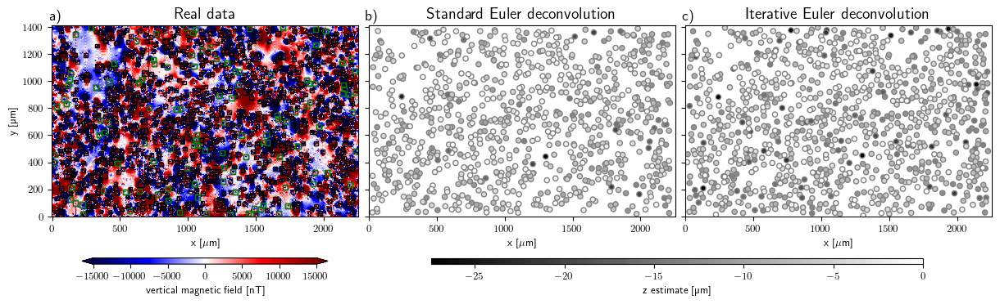

In [40]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    axes = axes.ravel()

    ax = axes[0]
    tmp1 = data['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_enhanced:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)

    for window in non_overlapping_windows:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="g",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    tmp = ax.scatter(*positions_itr_enhanced[:2], c=positions_itr_enhanced[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid escape sequence '\c'
<>:197: DeprecationWarning: invalid escape sequence '\c'
<>:199: DeprecationWarning: invalid escape sequence '\c'
<>:201: DeprecationWarning: invalid escape sequence '\c'
<>:203: DeprecationWarning: invalid escape sequence '\c'
<>:206: DeprecationWarning: invalid escape sequence '\g'
<>:207: DeprecationWarning: invalid escape sequence '\g'
<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid e

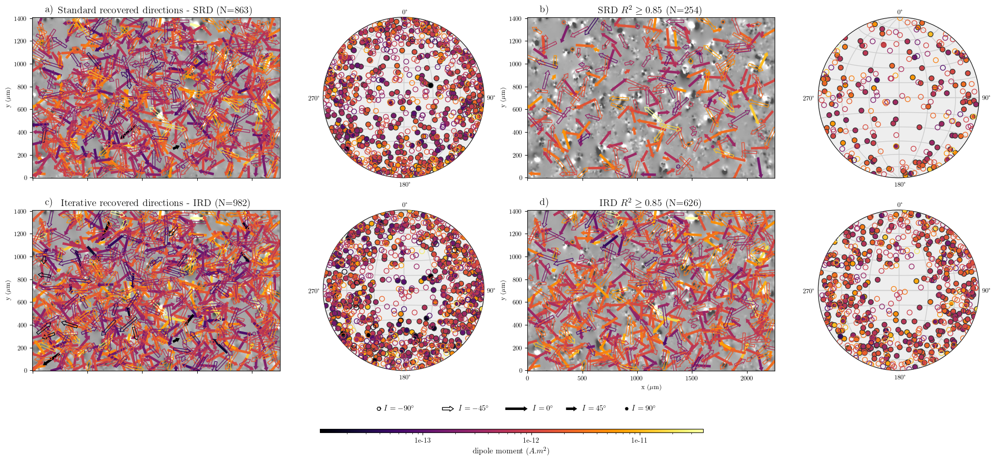

In [41]:
import warnings
warnings.filterwarnings('ignore')

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler_enhanced, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq 0.85$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq 0.85$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

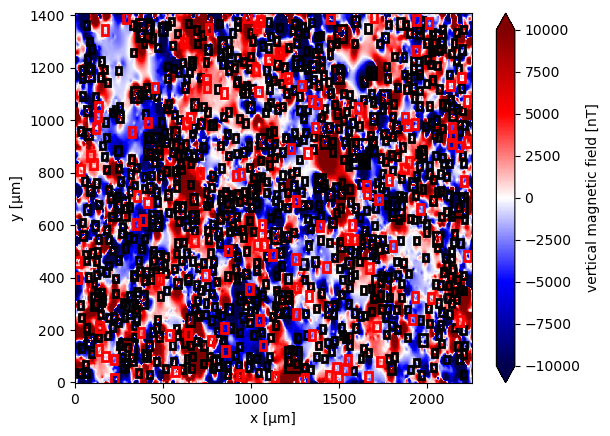

In [42]:
ax = plt.subplot(111)
data_up_copy_2.bz.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-10000, vmax=10000)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [43]:
np.asarray(calculated_r2_itr_euler_enhanced).T

array([ 0.9519849 ,  0.99162604,  0.97479836,  0.85840521,  0.84501952,
       -0.0070754 ,  0.97948338,  0.89694502,  0.93722971,  0.97937419,
        0.9510908 ,  0.65872421,  0.97936046,  0.88105391,  0.95416044,
        0.95552062,  0.80931072,  0.90668447,  0.98523703,  0.91438826,
        0.58363873,  0.74350222,  0.9497689 ,  0.839951  ,  0.98170365,
        0.8301102 ,  0.75792283,  0.91523995,  0.90644569,  0.93877485,
        0.95740462,  0.96854162,  0.39113732,  0.96725297,  0.81782028,
        0.94815169,  0.81794134,  0.93067519,  0.8489062 ,  0.82929183,
        0.99000547,  0.90663627,  0.94859688,  0.93578382,  0.88575675,
        0.76730622,  0.96504251,  0.89345604,  0.8901376 ,  0.91787743,
        0.85576729,  0.86445638,  0.82504404,  0.9402821 ,  0.90998782,
        0.93491029,  0.97613198,  0.93471515,  0.91676958,  0.9785158 ,
        0.82703897,  0.72716915,  0.8665805 ,  0.99005731,  0.93720543,
        0.83605719,  0.93518762,  0.90958235,  0.92613576,  0.94

# Show the observed and predicted data

In [44]:
predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced)
residuo = data.bz.values - predicted_data

data_up = data_up.assign(predicted_data=(['y','x'],predicted_data))
data_up.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}

error = data_up.bz.values - data_up.predicted_data.values

data_up = data_up.assign(error=(['y','x'],error))
data_up.error.attrs = {"long_name": "residual-data", "units": "nT"}

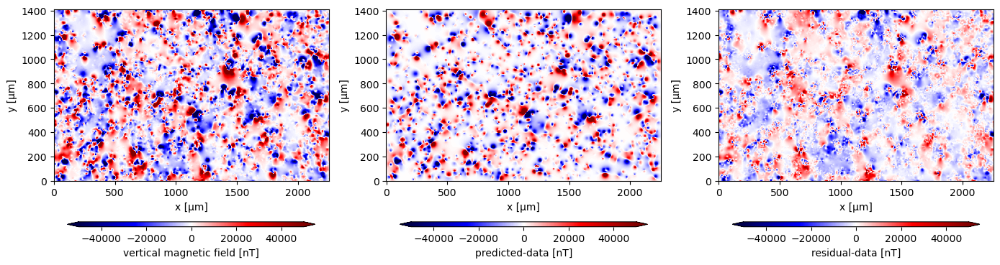

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "predicted_data", "error"], axes.ravel()):
    vmax = +50000
    vmin = -50000
    data_up[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

1
Individual source:   R2 = 0.9519849022455681


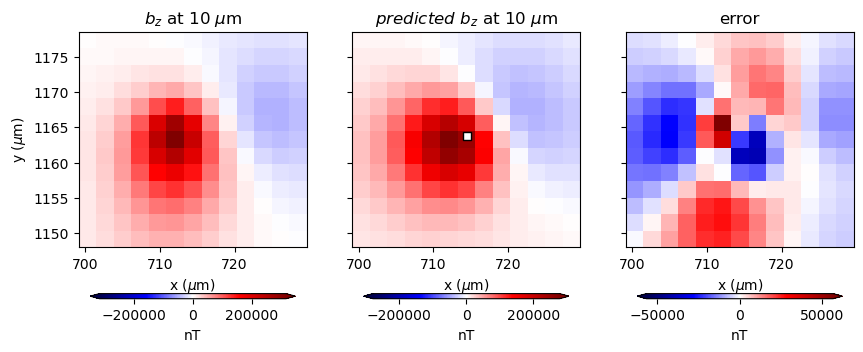

2
Individual source:   R2 = 0.9916260388538136


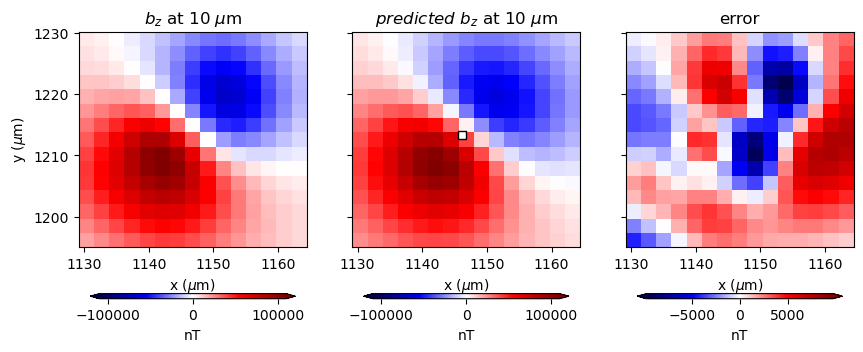

3
Individual source:   R2 = 0.9747983556361586


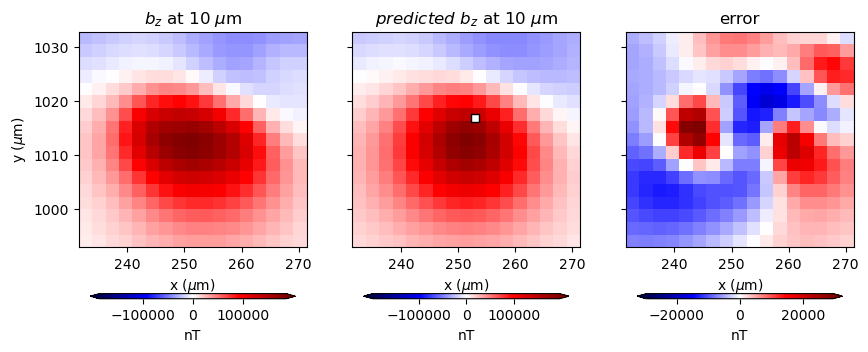

4
Individual source:   R2 = 0.8584052106613279


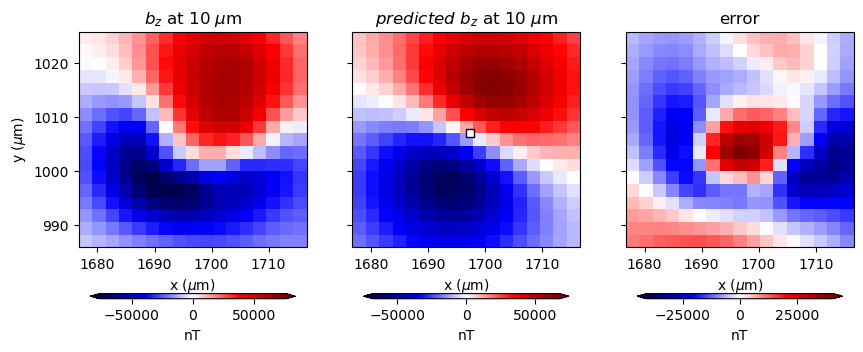

5
Individual source:   R2 = 0.8450195248428491


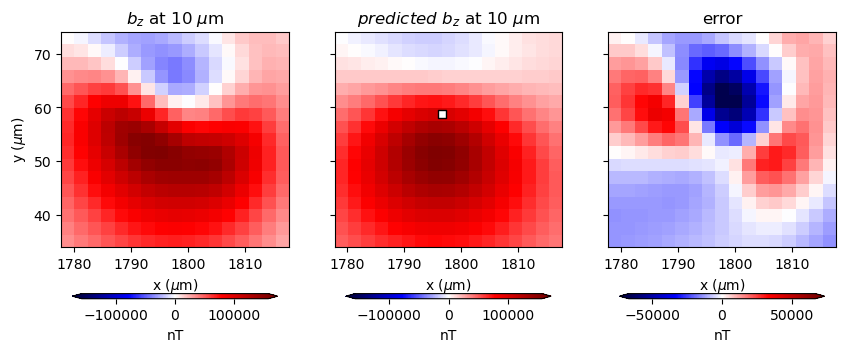

6
Individual source:   R2 = -0.00707539604280516


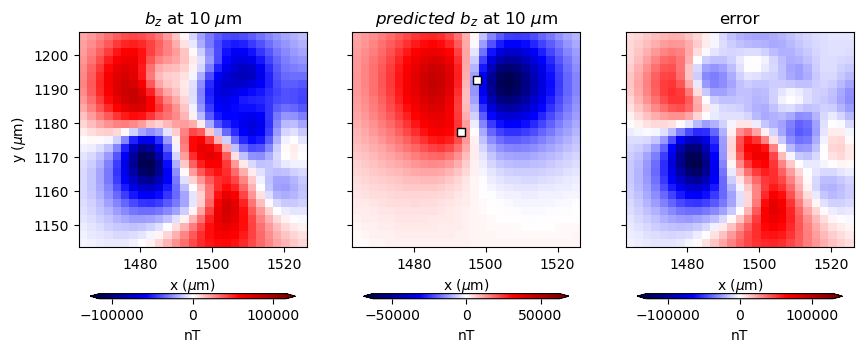

7
Individual source:   R2 = 0.9794833830598418


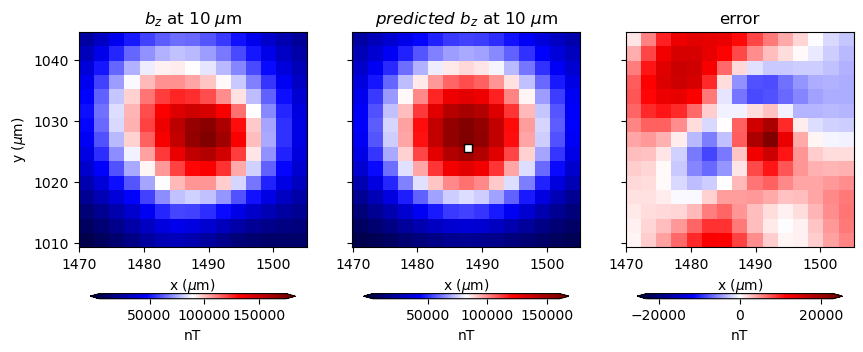

8
Individual source:   R2 = 0.8969450209058115


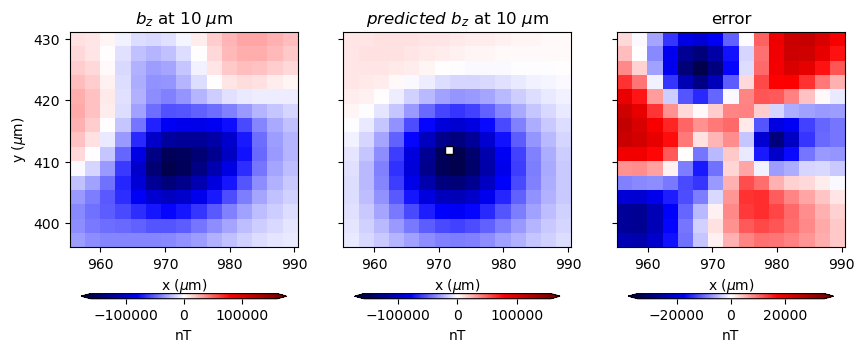

9
Individual source:   R2 = 0.9372297098150291


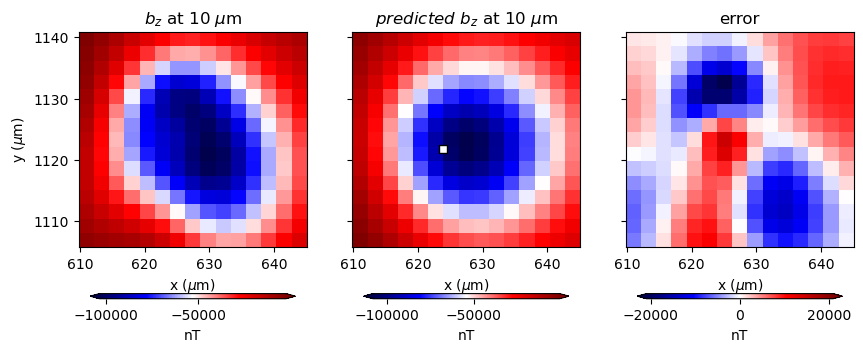

10
Individual source:   R2 = 0.9793741853610369


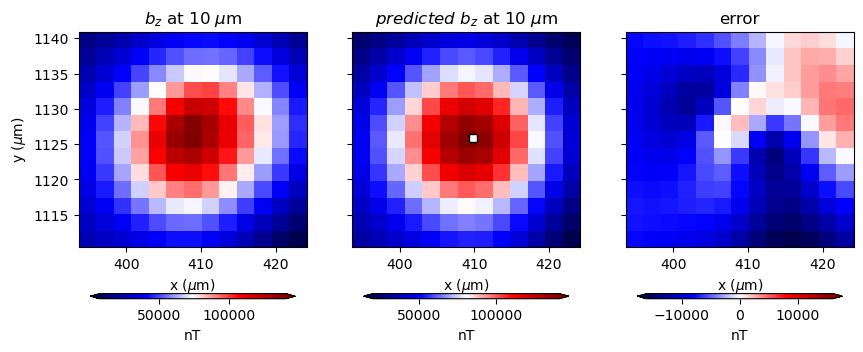

In [46]:
i = 0
slice_start=0#-20
slice_end=10#-1
for window, r2, base_level in zip(windows_enhanced[slice_start:slice_end], 
                                  calculated_r2_itr_euler_enhanced[slice_start:slice_end], 
                                  base_levels_itr_euler_enhanced[slice_start:slice_end]):

    if r2>=-np.inf:
        i=i+1
        print(i)
        # local_data = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        local_data = data_up.copy(deep=True)
        local_data = local_data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        
        fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey="row")
        axes = axes.ravel()    
        cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.9)
        
        ax = axes[0]
        ax.set_aspect("auto")
        ax.set_title(f"$b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        ax.set_ylabel("y ($\mu$m)")
        local_data.bz.values +- base_level
        tmp = local_data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        # ax.scatter(dipole_coordinates[0], dipole_coordinates[1], color='w', marker='o', edgecolors='k')
        
        ax = axes[1]
        ax.set_aspect("auto")
        ax.set_title(f"$predicted~b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        local_data.predicted_data.values += base_level
        tmp = local_data.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.scatter(positions_itr_enhanced[0], positions_itr_enhanced[1], color='w', marker='s', edgecolors='k')
        
        ax = axes[2]   
        ax.set_aspect("auto")
        ax.set_title("error")
        ax.set_xlabel("x ($\mu$m)")
        
        local_data.error.values = local_data.bz.values - local_data.predicted_data.values
        tmp = local_data.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        
    
        print(r"Individual source:   R2 = %s"%(r2))
    
        plt.show()

In [47]:
# Nome do arquivo ZIP
import os
output_folder = "csv_files_real_data"
os.makedirs(output_folder, exist_ok=True)

In [48]:
# Criar um DataFrame com os vetores
standard_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows)[:, 0],
    'xmax': np.asarray(windows)[:, 1],
    'ymin': np.asarray(windows)[:, 2],
    'ymax': np.asarray(windows)[:, 3],
    'xc_standard': np.asarray(positions)[0, :],
    'yc_standard': np.asarray(positions)[1, :],
    'zc_standard': np.asarray(positions)[2, :],
    'mx_standard': np.asarray(estimated_dipole_moments)[:,0],
    'my_standard': np.asarray(estimated_dipole_moments)[:,1],
    'mz_standard': np.asarray(estimated_dipole_moments)[:,2],
    'r_2_standard': np.asarray(calculated_r2),
})
standard_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_standard.csv'))
standard_dataframe.to_csv(standard_csv_name, index=False)

# Criar DataFrame para os vetores iterativos
iterative_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows_enhanced)[:, 0],
    'xmax': np.asarray(windows_enhanced)[:, 1],
    'ymin': np.asarray(windows_enhanced)[:, 2],
    'ymax': np.asarray(windows_enhanced)[:, 3],
    'xc_iterative': np.asarray(positions_itr_enhanced)[0, :],
    'yc_iterative': np.asarray(positions_itr_enhanced)[1, :],
    'zc_iterative': np.asarray(positions_itr_enhanced)[2, :],
    'mx_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,0],
    'my_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,1],
    'mz_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,2],
    'r_2_iterative': np.asarray(calculated_r2_itr_euler_enhanced),
})

# # Salvar DataFrame iterativo como CSV
iterative_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_iterative.csv'))
iterative_dataframe.to_csv(iterative_csv_name, index=False)